<a href="https://colab.research.google.com/github/Kenz2000/Projet-DATA2/blob/Amir/class3_word2vec_Glov.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Installation des packages**

In [ ]:
!pip install gdown
!pip install ipython-autotime
%load_ext autotime
#!pip install gensim
!pip install pandas
!pip install -U scikit-learn
!pip install tables
!pip install torch torchvision torchaudio
!pip install matplotlib
!pip install transformers
!pip install torch torchvision torchaudio
!pip install umap-learn
!pip install hdbscan

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 49.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 76.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/

In [ ]:
pip install gensim==4.3.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 15 s (started: 2023-05-18 20:11:39 +00:00)


**Chargement des utilitaires**

In [ ]:
! gdown 'https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD'

Downloading...
From: https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD
To: /content/utils_py.py
100% 6.69k/6.69k [00:00<00:00, 19.8MB/s]
time: 1.31 s (started: 2023-05-18 20:13:05 +00:00)


**importation des pacakges**

In [ ]:
from sklearn.cluster import KMeans ,AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import numpy as np
import hdbscan
from sklearn.metrics.cluster import normalized_mutual_info_score, adjusted_rand_score
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from umap import UMAP
from utils_py import accuracy
from gensim.models import KeyedVectors
import pandas as pd
import numpy as np
import warnings
import re
from utils_py import static_document_embeddings, tokenize_re

/content/utils_py.py:167: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if len(sys.argv) is not 3:


time: 7.55 s (started: 2023-05-18 20:13:10 +00:00)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
time: 12.3 s (started: 2023-05-18 20:14:06 +00:00)


**Importation du dataset classic3**

In [ ]:
import pandas as pd
df = pd.read_csv("./classic3.csv")
texts = df['text'].values
classic3_labels = df["label"].values
k_classic3 = len(df['label'].unique())
#print(k_classic3)

# **Représentation Word2Vec**

In [ ]:
#word2vec_model = KeyedVectors.load_word2vec_format("./drive/MyDrive/Data2/GoogleNews-vectors-negative300.bin.gz", binary=True)

In [ ]:
# vocab = word2vec_model.index_to_key
# get_word2vec_vector = lambda x: word2vec_model[x] if x in vocab else None

time: 980 µs (started: 2023-05-17 18:14:00 +00:00)


In [ ]:

# classic3_word2vec = static_document_embeddings(get_word2vec_vector, texts, tokenize_re)

time: 1h 10min 14s (started: 2023-05-17 18:14:06 +00:00)


In [ ]:
#pd.DataFrame(classic3_word2vec).to_hdf('./drive/MyDrive/Data2/classic3_word2vec.h5', key='df', mode='w')

time: 371 ms (started: 2023-05-17 19:45:00 +00:00)


**word2vec**

In [ ]:
#! gdown "/content/drive/MyDrive/Data2/classic3_word2vec.h5"
classic3_word2vec= pd.read_hdf("/content/drive/MyDrive/Data2/classic3_word2vec.h5").to_numpy()

time: 654 ms (started: 2023-05-18 08:07:34 +00:00)


**Approche Tandem**

In [ ]:
from torch.utils.data import DataLoader
import numpy as np
import torch
from tqdm import tqdm 

class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.embedding_dim)
        )
        
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.input_dim),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

    if seed is not None:
      torch.manual_seed(seed)

    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)

    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)
          
          loss = loss_function(reconstructed, batch)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

time: 3.29 ms (started: 2023-05-18 20:15:50 +00:00)


In [ ]:
def map_labels(labels):
    mapping = {}
    for (i,name) in enumerate(set(labels)):
        mapping[name] = i
    return [mapping[letter] for letter in labels]

time: 795 µs (started: 2023-05-18 20:15:57 +00:00)


In [ ]:
def eval_clustering_2D(x, labels, pred_labels, methods):
    fig, axes = plt.subplots(int((len(pred_labels)+1)/3) if not (len(pred_labels)+1)%3 else int((len(pred_labels)+1)/3+1) , 3, figsize=(20,25))
    axes = [item for sublist in axes for item in sublist]
    axes[0].scatter(x[:,0], x[:,1],
                    c=labels, edgecolor='none', alpha=1,)
    axes[0].title.set_text('Real Labels')
    results = {}
    for i in range(len(pred_labels)):
        nmi = normalized_mutual_info_score(labels, pred_labels[i])
        ari = adjusted_rand_score(labels, pred_labels[i])
        acc = accuracy(labels, pred_labels[i])
        results[methods[i]] = (nmi,ari,acc)
        axes[i+1].scatter(x[:,0], x[:,1],
                    c=pred_labels[i], edgecolor='none', alpha=1,)
        axes[i+1].title.set_text(f'{methods[i]}\nNMI = {nmi}\nARI={ari}\nAcc={acc}')
    plt.show()
    return results

time: 2.11 ms (started: 2023-05-18 20:16:01 +00:00)


In [ ]:
#pip install scikit-learn
!pip install scikit-learn-extra

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 37.8 MB/s eta 0:00:00
time: 5.94 s (started: 2023-05-18 20:16:08 +00:00)


In [ ]:
from sklearn_extra.cluster import KMedoids
def run_clustering(X, k, labels, spectral=False):
    kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
    hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
    cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
    cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
    cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
    cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)
    gaussian = GaussianMixture(n_components=k, random_state=42).fit_predict(X)
    kmedoids_labels = KMedoids(n_clusters=k).fit(X).labels_
    
    
    if spectral:
        spectral_labels = SpectralClustering(k, assign_labels="discretize", random_state=42).fit(X).labels_
        return eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian,kmedoids_labels], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG","Kmedoid"])

    else:
        return eval_clustering_2D(X, labels, [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian,kmedoids_labels], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG","Kmedoid"])

time: 24.8 ms (started: 2023-05-18 20:16:18 +00:00)


In [ ]:
methods = ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)","Kmedoid","SphKmeans"]
methods_noSpec = ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)","Kmedoid","SphKmeans"]

time: 1.92 ms (started: 2023-05-18 20:16:24 +00:00)


In [ ]:
results_classic3_redim = {}

time: 2.41 ms (started: 2023-05-18 20:16:40 +00:00)


In [ ]:
pip install mvlearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.9/37.9 MB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for matplotlib: filename=matplotlib-3.3.4-cp310-cp310-linux_x86_64.whl size=11772894 sha256=d0543d795139dd3c0b9aadeb8b07787fe5a3ffc483d70f1abd72553700db688f
  Stored in directory: /root/.cache/pip/wheels/38/c6/49/eaba6d234887d98d9c85185e2a90bd7bb77934e85eefaf317e
Successfully built matplotlib
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mizani 0.8.1 requires matplotlib>=3.5.0, but you

time: 2min 10s (started: 2023-05-18 20:16:44 +00:00)


**Espace original**

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic3_word2vec)
kmeans_labels = KMeans(k_classic3, random_state=42).fit(classic3_word2vec).labels_
kmedoids_labels = KMedoids(n_clusters=k_classic3).fit(classic3_word2vec).labels_
spectral_labels = SpectralClustering(k_classic3, n_components= classic3_word2vec.shape[1], assign_labels="discretize", random_state=42).fit(classic3_word2vec).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic3_word2vec).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic3).fit_predict(classic3_word2vec)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic3, linkage="complete").fit_predict(classic3_word2vec)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic3, linkage="average").fit_predict(classic3_word2vec)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic3, linkage="single").fit_predict(classic3_word2vec)
gaussian = GaussianMixture(n_components=k_classic3, random_state=42).fit_predict(classic3_word2vec)

NameError: ignored

time: 166 ms (started: 2023-05-18 20:21:00 +00:00)


**Méthodes de clustering sur l'espace original**

Cette fonction permet d'appliquer les méthodes de clustering (K-means, MMG, CAH, HDBSCAN,K-medoid,spectral clustering) sur l'espace d'origine et retourner des visualisations en 2D  des résultats obtenus (les clusters et les scores).

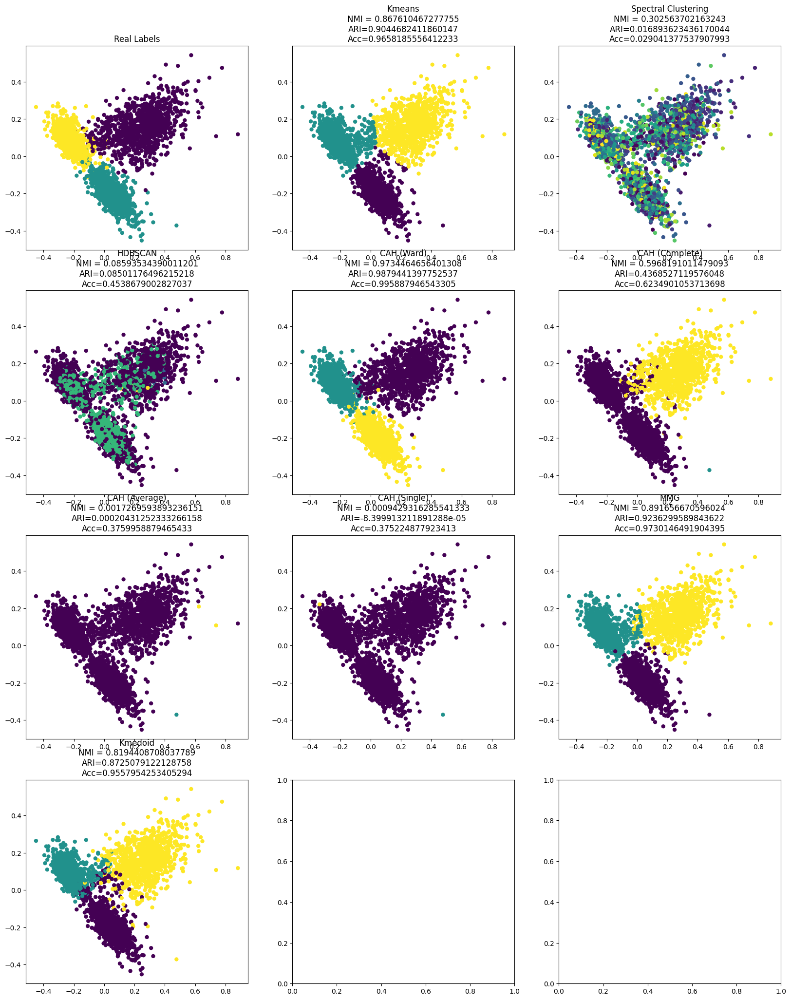

time: 4.79 s (started: 2023-05-18 08:31:44 +00:00)


In [ ]:
results_classic3_redim["original"] = eval_clustering_2D(X_reduced, map_labels(classic3_labels), [kmeans_labels ,spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian,kmedoids_labels], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG","Kmedoid","SphKmeans"])

**Interprétation:** 
Les résultats obtenus sont significatifs pour certaines méthodes de clustering, notamment : K-means, K-medoid, MMG et CAH avec le critère ward, en fonction des scores. L'accuracy dépasse 95%, le NMI dépasse 81% et l'ARI dépasse 87%. De plus, ces méthodes parviennent à former les 3 clusters (classes) qui sont séparés et homogènes. En revanche, nous pouvons remarquer que certaines méthodes de clustering ont donné de faibles scores en termes d'accuracy, de NMI et d'ARI, telles que HDBSCAN, CAH (single, average) et spectral clustering.

Il est à noter que les méthodes HDBSCAN et spectral clustering ont formé des clusters qui se chevauchent, tandis que la méthode CAH avec les deux critères single et average n'arrive pas à former les 3 clusters


**Approche Tandem (reduction de la dimension + méthode de clustering )**

**Espace reduit**

Dans cette section, nous appliquons les méthodes de clustering sur l'espace réduit par les techniques de réduction de dimension telles que : PCA, t-SNE, UMAP et autoencodeur.

**PCA+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


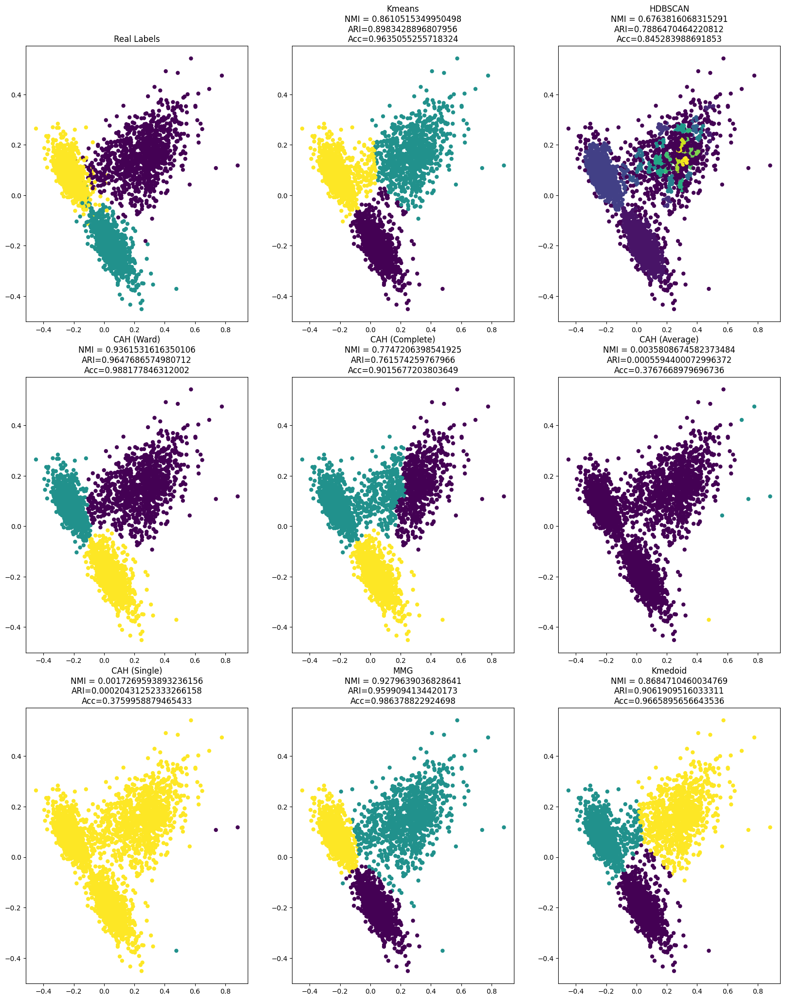

time: 5.65 s (started: 2023-05-18 08:34:45 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic3_word2vec)
results_classic3_redim['pca2'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
Après l'application des méthodes de clustering sur l'espace réduit en utilisant PCA avec 2 dimensions, nous constatons une nette amélioration des scores par rapport aux résultats obtenus dans l'espace d'origine, notamment pour les méthodes de clustering HDBSCAN et CAH (complete). L'accuracy dépasse désormais 84%, le NMI dépasse 67% et l'ARI dépasse 76%. En ce qui concerne la formation des clusters, nous observons que la méthode CAH (complete) réussit cette fois-ci à former les 3 clusters qui sont mieux séparés et homogènes, tandis que les clusters de HDBSCAN restent chevauchés.

Nous pouvons également remarquer que les résultats obtenus par CAH (single et average) n'ont pas été améliorés en termes de scores et de formation des clusters.

**PCA avec PC=20+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


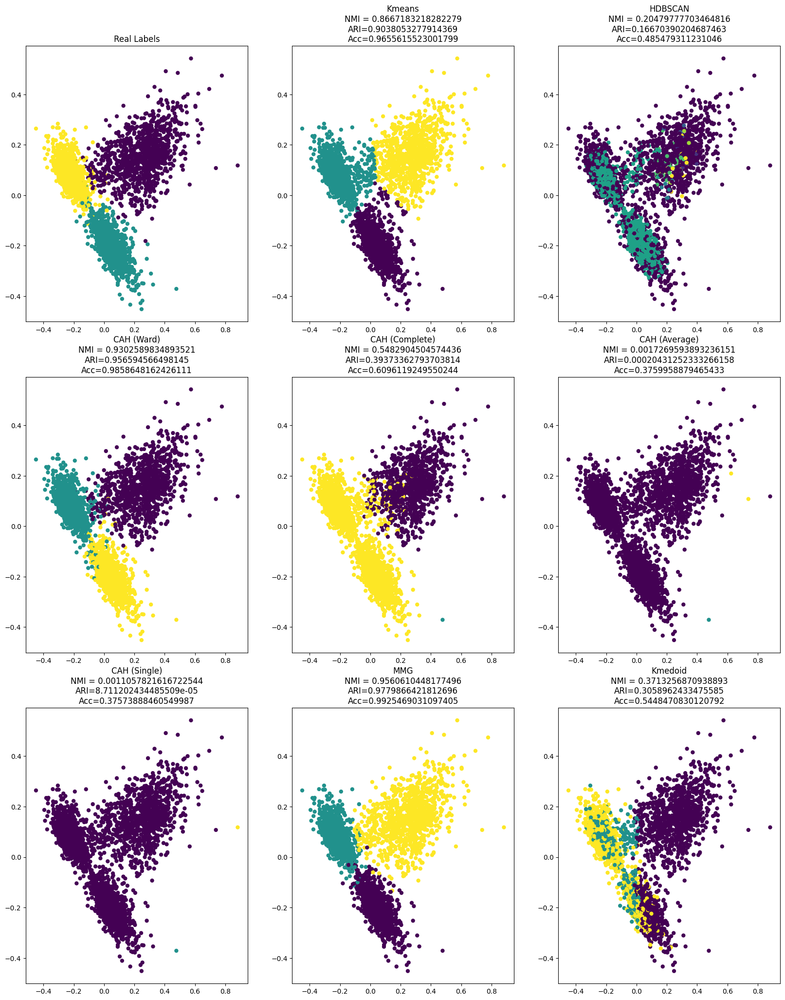

time: 8.34 s (started: 2023-05-18 08:36:21 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(classic3_word2vec)
results_classic3_redim['pca20'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
Après avoir réduit l'espace à l'aide de PCA avec 20 dimensions, nous constatons une nette détérioration des scores (précision, NMI et ARI) pour les méthodes de clustering suivantes : HDBSCAN, CAH (complete, average, single) et K-medoid. En revanche, nous observons une légère amélioration pour K-means et MMG.

Il est à noter que les méthodes CAH(ward),MMG et k-means respectivement restent les meilleures en termes des résultats des scores obtenus.



```
# Ce texte est au format code
```

**t-SNE+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


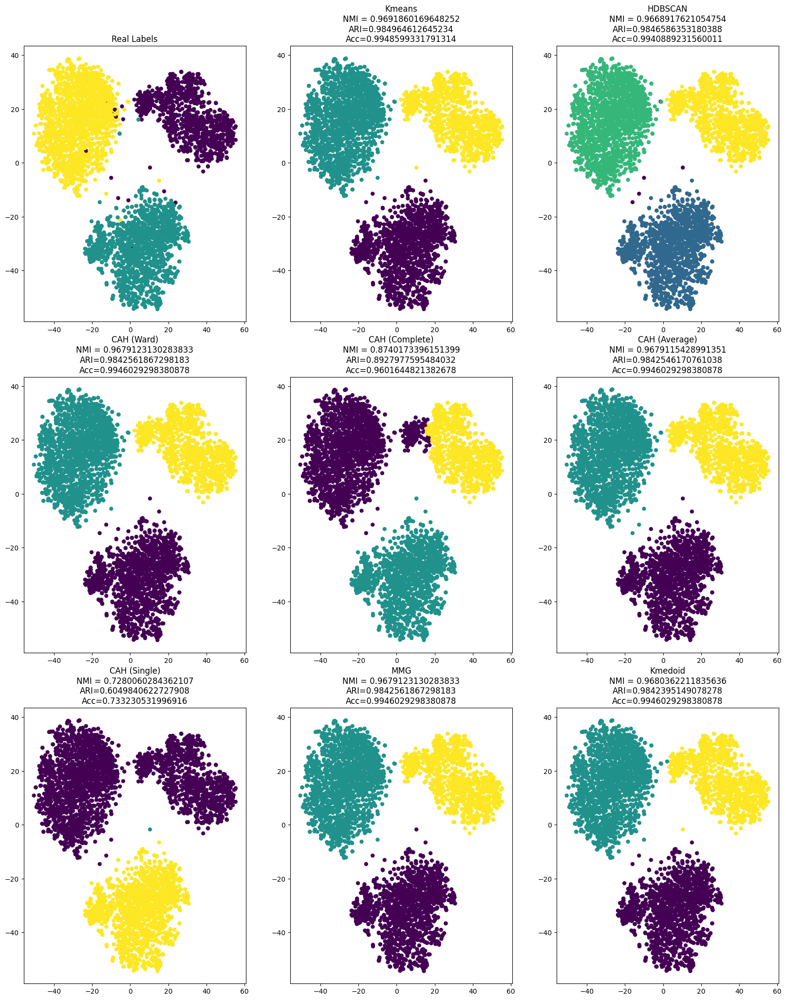

time: 48.3 s (started: 2023-05-18 08:36:30 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic3_word2vec)
results_classic3_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic3, map_labels(classic3_labels))

**Interprétation:**
Après l'application des méthodes de clustering sur l'espace réduit en utilisant t-SNE avec 2 dimensions, nous constatons une nette amélioration des scores pour toutes les méthodes de clustering et surtout  k-means, MMG, K-medoid, CAH (average, ward) et HDBSCAN  avec un taux d'accuracy dépasse désormais 99%, le NMI dépasse 96% et l'ARI dépasse 98%. De plus, nous observons que les clusters formés sont mieux séparés et homogènes par rapport aux résultats précédents.

 

**UMAP+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


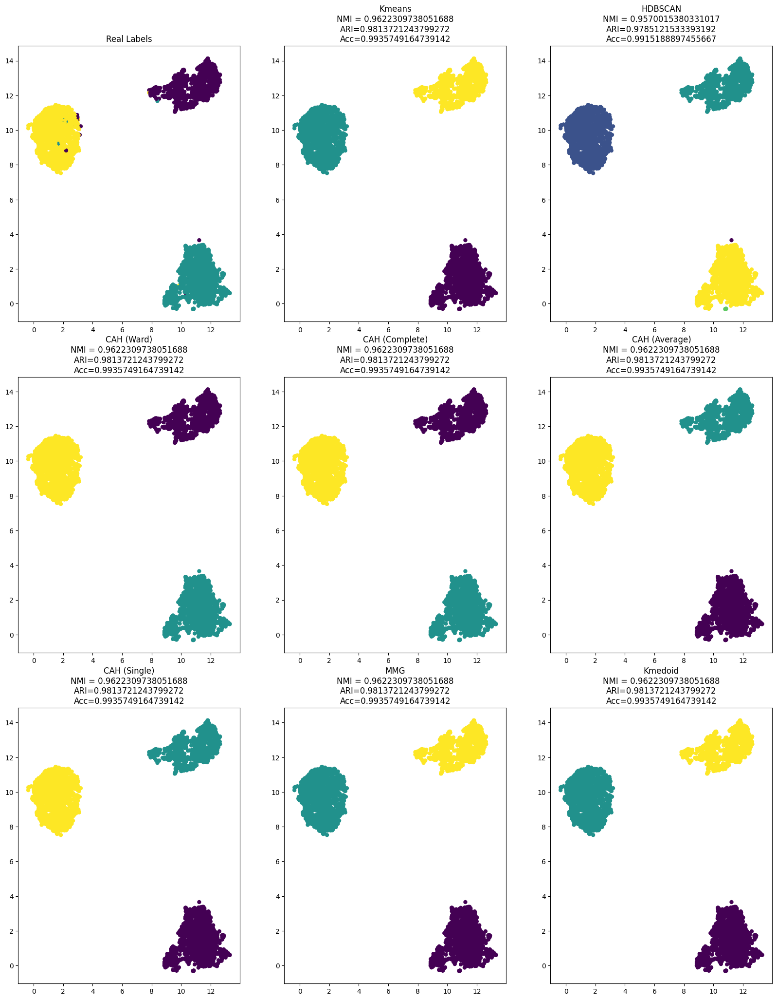

time: 35.5 s (started: 2023-05-18 08:37:18 +00:00)


In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic3_word2vec)
results_classic3_redim['umap'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
La technique UMAP avec 2 dimensions a produit des résultats significativement meilleurs en termes de scores pour toutes les méthodes de clustering que nous avons utilisées. L'accuracy dépasse 99%, le NMI dépasse 95% et l'ARI dépasse 97%. De plus, les résultats de la méthode CAH avec le critère single se sont améliorés cette fois-ci, surpassant ceux obtenus avec t-SNE.

Il est à noter que toutes les méthodes de clustering ont clairement démontré une grande séparabilité et homogénéité des clusters formés.

**UMAP avec 20 PC+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


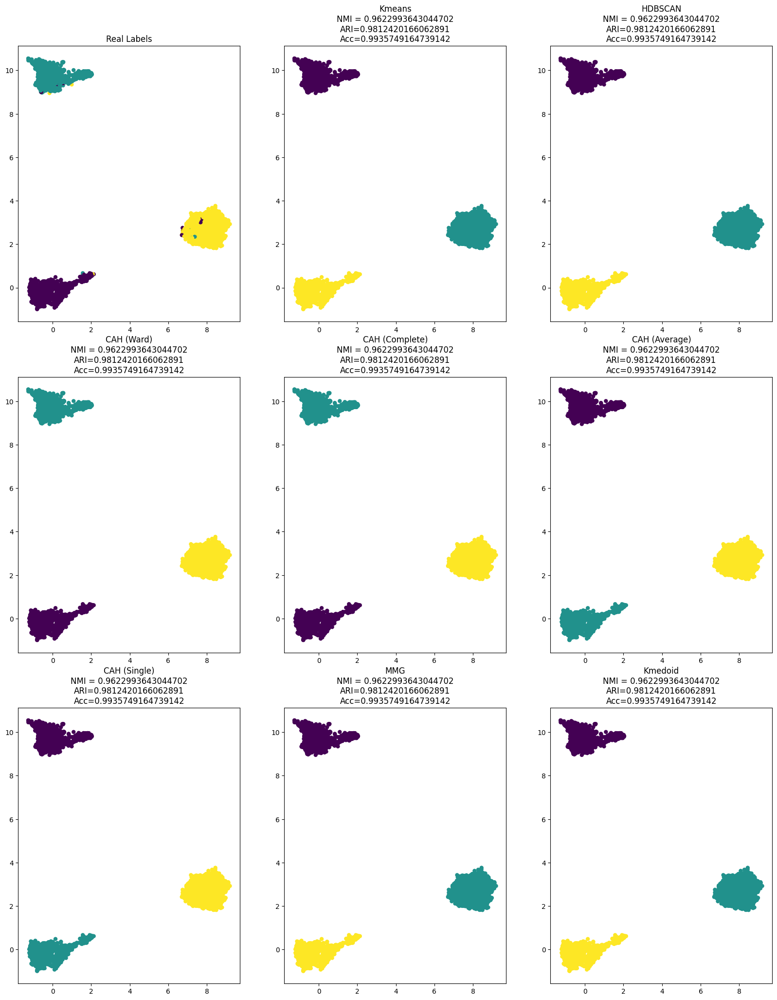

time: 38 s (started: 2023-05-18 08:37:54 +00:00)


In [ ]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(classic3_word2vec)
results_classic3_redim['umap20'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
L'utilisation de UMAP avec 20 dimensions a donné des résultats pratiquement identiques à ceux obtenus avec UMAP en 2 dimensions, à l'exception des scores de la méthode HDBSCAN qui se sont légèrement améliorés cette fois-ci. Le taux de NMI est de 96% et l'ARI est de 98%.

Il est à noter que toutes les méthodes de clustering ont clairement démontré une grande séparabilité et homogénéité des clusters formés.

**Autoencoder + méthodes de clustering**

100%|██████████| 50/50 [00:38<00:00,  1.31it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


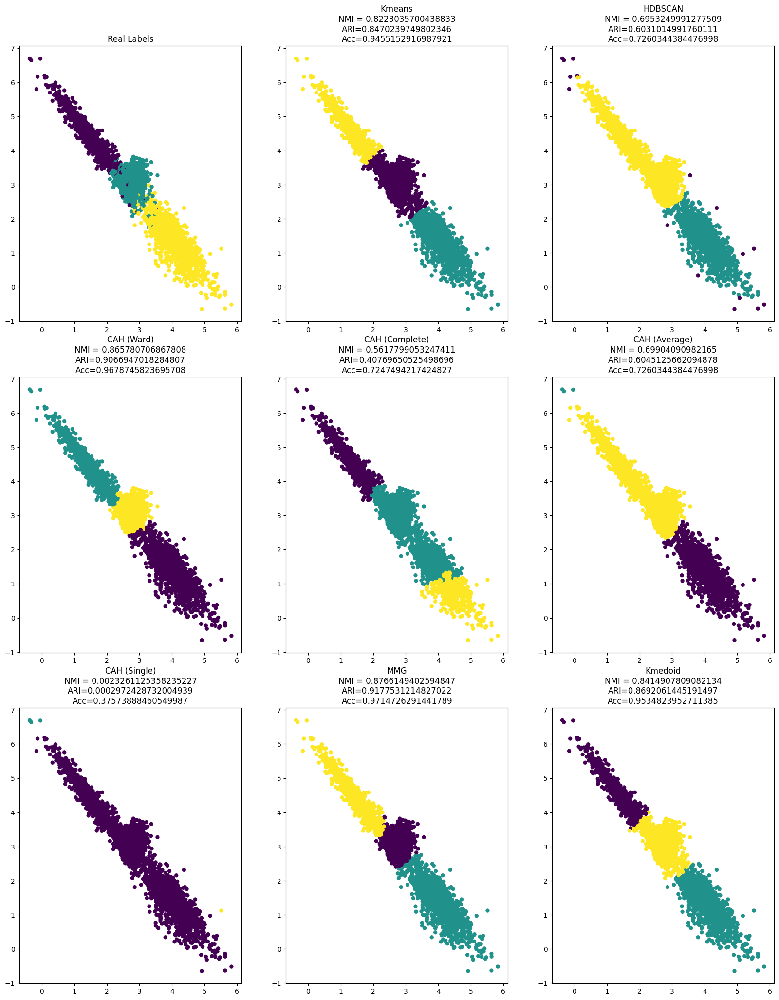

time: 46.4 s (started: 2023-05-18 08:39:35 +00:00)


In [ ]:
n_components=2
X_reduced = autoencoder(classic3_word2vec.astype("float32"), n_components, seed=42, learning_rate=1e-3)
results_classic3_redim['autoencoder'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
Après l'application des méthodes de clustering sur l'espace réduit en utilisant l'autoencodeur avec 2 dimensions, nous remarquons en général une diminution des scores obtenus pour toutes les méthodes de clustering par rapport aux résultats précédents. En particulier, la méthode CAH (critère=single) présente un taux d'accuracy de 37%, un ARI de 0,029% et un NMI de 0,023%. ainsi que la méthode HDBSCAN affiche un taux d'accuracy de 72%, un ARI de 60% et un NMI de 69%. De plus, ces deux méthodes ont formé des clusters qui se chevauchent.

D'un autre côté, les méthodes telles que K-means, K-medoid, MMG et CAH (ward, complete) ont réussi à former des clusters distincts, cependant, ils présentent une séparation et une homogénéité moindres par rapport aux résultats obtenus avec UMAP et t-SNE

 

In [ ]:
from copy import deepcopy
results_temp = deepcopy(results_classic3_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 2.2 ms (started: 2023-05-18 08:43:19 +00:00)


In [ ]:
results_word2vec_classic3 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 21.7 ms (started: 2023-05-18 08:43:20 +00:00)


**Tableau récapitulatif de tous les résultats obtenus**

In [ ]:
results_word2vec_classic3

nmi       ari       acc
original    Kmeans               0.867610  0.904468  0.965819
            Spectral Clustering  0.302564  0.016894  0.029041
            HDBSCAN              0.085935  0.085012  0.453868
            CAH (Ward)           0.973446  0.987944  0.995888
            CAH (Complete)       0.596819  0.436853  0.623490
            CAH (Average)        0.001727  0.000204  0.375996
            CAH (Single)         0.000943 -0.000084  0.375225
            MMG                  0.891657  0.923630  0.973015
            Kmedoid              0.819441  0.872508  0.955795
pca2        Kmeans               0.861052  0.898343  0.963506
            HDBSCAN              0.676382  0.788647  0.845284
            CAH (Ward)           0.936153  0.964769  0.988178
            CAH (Complete)       0.774721  0.761574  0.901568
            CAH (Average)        0.003581  0.000559  0.376767
            CAH (Single)         0.001727  0.000204  0.375996
            MMG                  0.927964  0.959909  0.986379
            Kmedoid              0.868471  0.906191  0.966590
pca20       Kmeans               0.866718  0.903805  0.965562
            HDBSCAN              0.204798  0.166704  0.485479
            CAH (Ward)           0.930259  0.956595  0.985865
            CAH (Complete)       0.548290  0.393734  0.609612
            CAH (Average)        0.001727  0.000204  0.375996
            CAH (Single)         0.001106  0.000087  0.375739
            MMG                  0.956061  0.977987  0.992547
            Kmedoid              0.371326  0.305896  0.544847
tsne        Kmeans               0.969186  0.984965  0.994860
            HDBSCAN              0.966892  0.984659  0.994089
            CAH (Ward)           0.967912  0.984256  0.994603
            CAH (Complete)       0.874017  0.892798  0.960164
            CAH (Average)        0.967912  0.984255  0.994603
            CAH (Single)         0.728006  0.604984  0.733231
            MMG                  0.967912  0.984256  0.994603
            Kmedoid              0.968036  0.984240  0.994603
umap        Kmeans               0.962231  0.981372  0.993575
            HDBSCAN              0.957002  0.978512  0.991519
            CAH (Ward)           0.962231  0.981372  0.993575
            CAH (Complete)       0.962231  0.981372  0.993575
            CAH (Average)        0.962231  0.981372  0.993575
            CAH (Single)         0.962231  0.981372  0.993575
            MMG                  0.962231  0.981372  0.993575
            Kmedoid              0.962231  0.981372  0.993575
umap20      Kmeans               0.962299  0.981242  0.993575
            HDBSCAN              0.962299  0.981242  0.993575
            CAH (Ward)           0.962299  0.981242  0.993575
            CAH (Complete)       0.962299  0.981242  0.993575
            CAH (Average)        0.962299  0.981242  0.993575
            CAH (Single)         0.962299  0.981242  0.993575
            MMG                  0.962299  0.981242  0.993575
            Kmedoid              0.962299  0.981242  0.993575
autoencoder Kmeans               0.822304  0.847024  0.945515
            HDBSCAN              0.695325  0.603101  0.726034
            CAH (Ward)           0.865781  0.906695  0.967875
            CAH (Complete)       0.561780  0.407697  0.724749
            CAH (Average)        0.699041  0.604513  0.726034
            CAH (Single)         0.002326  0.000297  0.375739
            MMG                  0.876615  0.917753  0.971473
            Kmedoid              0.841491  0.869206  0.953482

time: 31.9 ms (started: 2023-05-18 08:43:20 +00:00)


In [ ]:
metric = "ari"
results_word2vec_classic3[results_word2vec_classic3[metric] == results_word2vec_classic3[metric].max()]

,,nmi,ari,acc
original,CAH (Ward),0.973446,0.987944,0.995888


time: 35.9 ms (started: 2023-05-18 11:52:51 +00:00)


In [ ]:
metric = "nmi"
results_word2vec_classic3[results_word2vec_classic3[metric] == results_word2vec_classic3[metric].nlargest(2)]

,,nmi,ari,acc
original,CAH (Ward),0.973446,0.987944,0.995888


time: 17.3 ms (started: 2023-05-18 08:43:20 +00:00)


In [ ]:
metric = "acc"
results_word2vec_classic3[results_word2vec_classic3[metric] == results_word2vec_classic3[metric].nlargest(2)]

,,nmi,ari,acc
original,CAH (Ward),0.973446,0.987944,0.995888


time: 19.5 ms (started: 2023-05-18 08:43:20 +00:00)


Après avoir examiné les résultats de toutes les méthodes de clustering appliquées sur l'espace d'origine et sur l'espace réduit, il est clair, d'après le tableau récapitulatif, que la méthode CAH avec le critère ward a obtenu les meilleurs scores (accuracy, NMI et ARI) lorsqu'elle est appliquée sur l'espace d'origine. Cependant, lorsque cette méthode (CAH avec critère ward) est appliquée sur l'espace réduit par t-SNE et surtout par UMAP, elle démontre une séparation et une homogénéité des clusters nettement meilleures.

Le modèle le plus performant est CAH avec le critère Ward lorsqu'il est appliqué sur UMAP avec 2 composantes.

In [ ]:
X_reduced_umap = UMAP(n_components=2, random_state=42).fit_transform(classic3_word2vec)
best_labels = AgglomerativeClustering(n_clusters=k_classic3).fit_predict(X_reduced_umap)

time: 46.9 s (started: 2023-05-18 13:59:10 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 77.5 ms (started: 2023-05-18 20:57:17 +00:00)


Class: 2


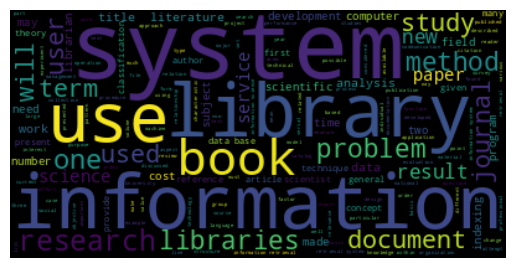



Class: 0


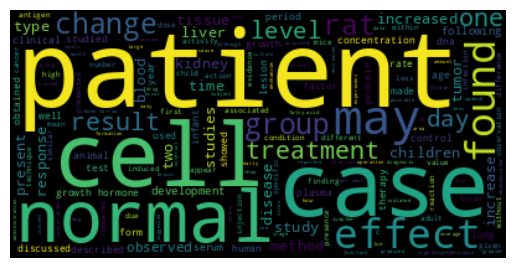



Class: 1


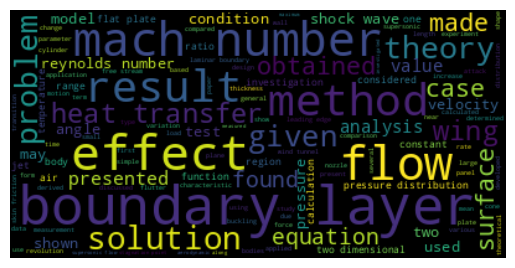



time: 4.42 s (started: 2023-05-18 12:05:10 +00:00)


In [ ]:
print_wordcloud(df['text'].values, best_labels)

Class: cisi


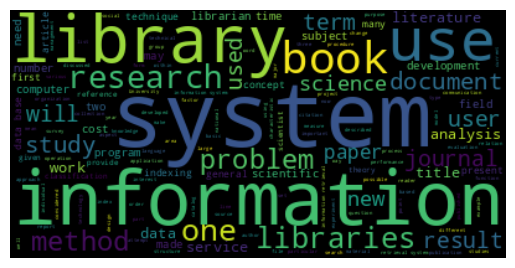



Class: med


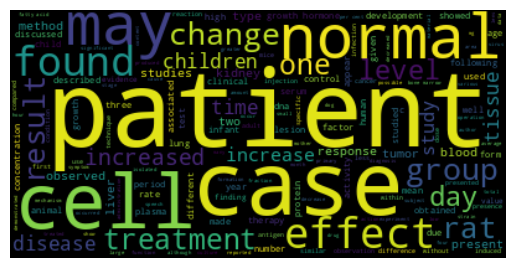



Class: cran


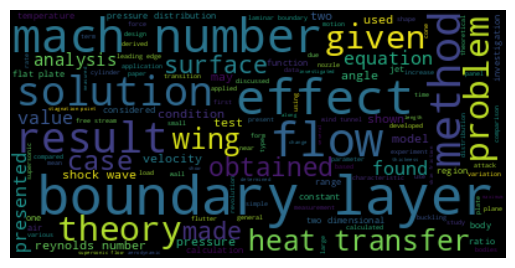



time: 5.8 s (started: 2023-05-18 12:05:22 +00:00)


In [ ]:
print_wordcloud(df['text'].values, df['label'].values)

Aprés l'analyse et l'examination du nuage de mots et en comparant les classes prédites avec les vrais classes, nous constatons que : la classe 0 (prédite) est associée approximativement à "med"(la vraie classe) en raison de la similarité des termes les plus fréquents dans les deux classes. 
La classe 1 correspond approximativement à "cran" car les termes les plus fréquents sont les mêmes. 

la classe 2 peut être associée approximativement comme "cisi" en raison des termes les plus fréquents communs. 

**Les méthodes d'estimation du nombre de clusters en utilisant l'algorithme Kmeans**

**à l'aide du score silhouette**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


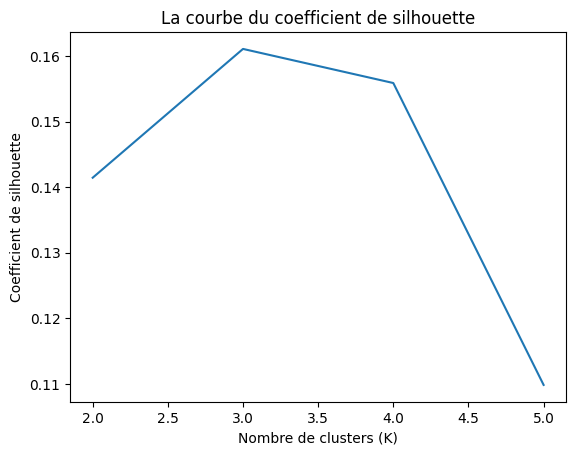

time: 21.1 s (started: 2023-05-18 16:46:27 +00:00)


In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
s_scores = [] # liste des valeurs de silhouette pour diférentes valeurs de k
for k in range(2, 6):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(classic3_word2vec)
    labels = kmeans.labels_
    s_scores.append(silhouette_score(classic3_word2vec, labels))

# Plot la courbe
plt.plot(range(2, 6), s_scores)
plt.xlabel('Nombre de clusters (K)')
plt.ylabel('Coefficient de silhouette')
plt.title('La courbe du coefficient de silhouette')
plt.show()

En analysant la courbe des scores de silhouette en fonction du nombre de clusters, nous remarquons que le nombre de clusters approprié, k, correspond au score de silhouette le plus élevé, qui est de 0.16. Par conséquent, nous pouvons conclure que k=3 serait le nombre de clusters approprié.

**à l'aide de la méthode du coude (Elbow Method)**

---


 



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


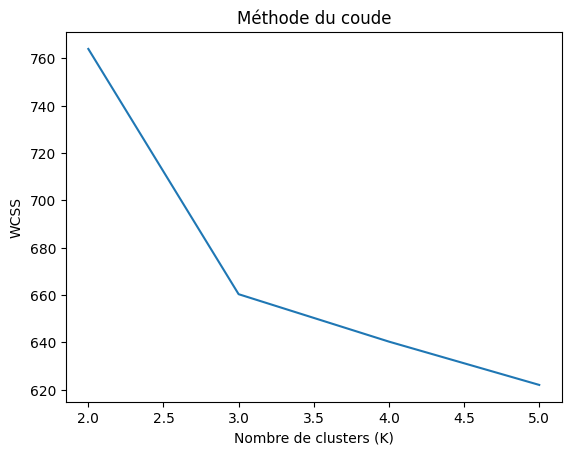

time: 17.4 s (started: 2023-05-18 16:27:23 +00:00)


In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
wcss = [] # liste des sommes des carrés intra-clusters
for k in range(2, 6):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(classic3_word2vec)  # Remplacez "data" par votre ensemble de données réel
    wcss.append(kmeans.inertia_)

# plot
plt.plot(range(2, 6), wcss)
plt.xlabel('Nombre de clusters (K)')
plt.ylabel('WCSS')
plt.title('Méthode du coude')
plt.show()

En analysant la courbe de la somme des carrés intra-clusters (WCSS) en fonction du nombre de clusters, nous remarquons un point d'inflexion (le point du coude) au niveau de 3. Cela suggère que 3 serait le nombre de clusters approprié.

## **Représentation Glove**

 



In [ ]:
#!wget -c "https://nlp.stanford.edu/data/glove.840B.300d.zip"

--2023-05-18 08:43:32--  https://nlp.stanford.edu/data/glove.840B.300d.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.840B.300d.zip [following]
--2023-05-18 08:43:32--  https://downloads.cs.stanford.edu/nlp/data/glove.840B.300d.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2176768927 (2.0G) [application/zip]
Saving to: ‘glove.840B.300d.zip’

glove.840B.300d.zip 100%[===================>]   2.03G  4.96MB/s    in 7m 5s   

2023-05-18 08:50:37 (4.89 MB/s) - ‘glove.840B.300d.zip’ saved [2176768927/2176768927]

time: 7min 5s (started: 2023-05-18 08:43:32 +00:00)


In [ ]:
#! unzip glove.840B.300d.zip

Archive:  glove.840B.300d.zip
  inflating: glove.840B.300d.txt     
time: 1min 30s (started: 2023-05-18 08:50:37 +00:00)


In [ ]:
# from gensim.test.utils import datapath, get_tmpfile
# from gensim.models import KeyedVectors
# from gensim.scripts.glove2word2vec import glove2word2vec

# glove_file = 'glove.840B.300d.txt'

time: 148 ms (started: 2023-05-18 08:52:08 +00:00)


In [ ]:
#glove_model=KeyedVectors.load_word2vec_format(glove_file,no_header=True)

time: 9min 52s (started: 2023-05-18 17:47:22 +00:00)


In [ ]:
# vocab =glove_model.index_to_key
# get_glove_vector = lambda x: glove_model[x] if x in vocab else None

time: 933 µs (started: 2023-05-18 18:40:11 +00:00)


In [ ]:
#classic3_glove = static_document_embeddings(get_glove_vector, texts, tokenize_re)

time: 8min 33s (started: 2023-05-18 18:40:14 +00:00)


**Glove**

In [ ]:
 #pd.DataFrame(classic3_glove).to_hdf('./drive/MyDrive/Data2/classic3_glove.h5', key='df', mode='w')
classic3_glove= pd.read_hdf("/content/drive/MyDrive/Data2/classic3_glove.h5").to_numpy()

time: 50.5 ms (started: 2023-05-19 01:25:22 +00:00)


In [ ]:
classic3_glove.shape

(3891, 300)

time: 15.1 ms (started: 2023-05-19 01:25:30 +00:00)


In [ ]:
results_classic3_glove = {}

time: 1.78 ms (started: 2023-05-19 01:25:31 +00:00)


# **`Espace d'origine`**

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic3_glove)
kmeans_labels = KMeans(k_classic3, random_state=42).fit(classic3_glove).labels_
kmedoids_labels = KMedoids(n_clusters=k_classic3).fit(classic3_glove).labels_
spectral_labels = SpectralClustering(k_classic3, n_components= classic3_glove.shape[1], assign_labels="discretize", random_state=42).fit(classic3_glove).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic3_glove).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic3).fit_predict(classic3_glove)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic3, linkage="complete").fit_predict(classic3_glove)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic3, linkage="average").fit_predict(classic3_glove)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic3, linkage="single").fit_predict(classic3_glove)
gaussian = GaussianMixture(n_components=k_classic3, random_state=42).fit_predict(classic3_glove)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


time: 1min 12s (started: 2023-05-19 01:25:31 +00:00)


**Méthodes de clustering sur l'espace original**

Cette fonction permet d'appliquer les méthodes de clustering (K-means, MMG, CAH, HDBSCAN,K-medoid,spectral clustering) sur l'espace d'origine et retourner des visualisations en 2D  des résultats obtenus (les clusters et les scores).

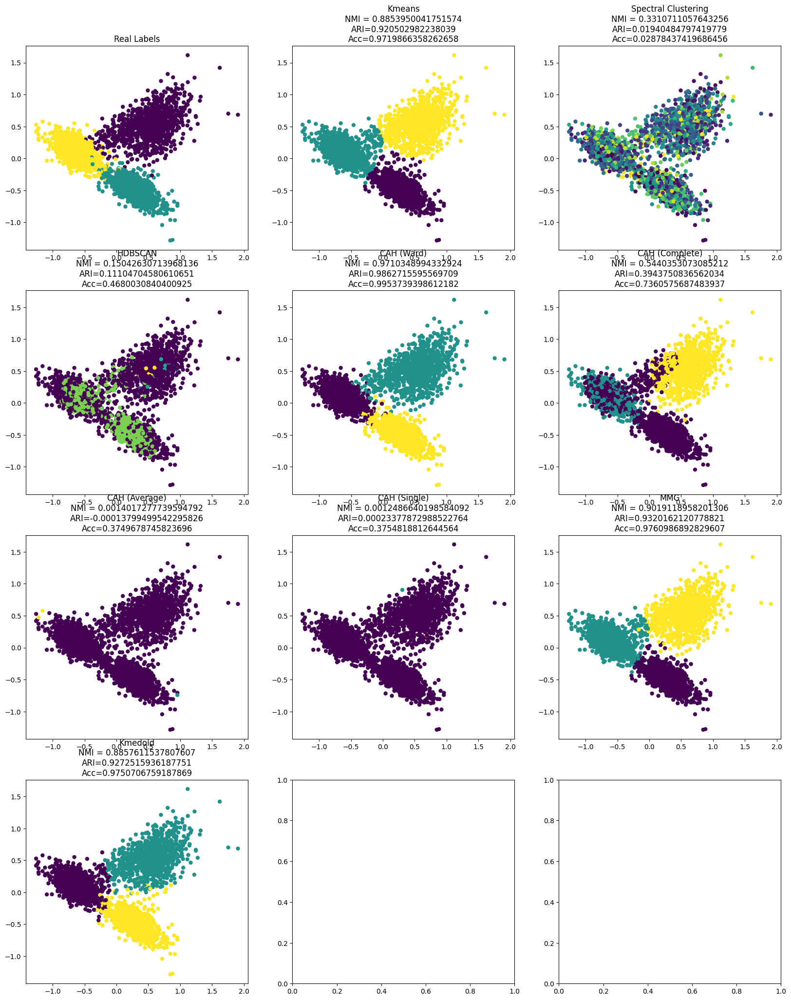

time: 4.97 s (started: 2023-05-19 01:26:44 +00:00)


In [ ]:
results_classic3_glove["original"] = eval_clustering_2D(X_reduced, map_labels(classic3_labels), [kmeans_labels ,spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian,kmedoids_labels], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG","Kmedoid","SphKmeans"])

**Interprétation:** 
Les résultats obtenus sont significatifs pour certaines méthodes de clustering, notamment : K-means, K-medoid, MMG et CAH avec le critère ward, en fonction des scores. L'accuracy dépasse 97%, le NMI dépasse 88% et l'ARI dépasse 92%. De plus, ces méthodes parviennent à former les 3 clusters (classes) qui sont séparés et homogènes. En revanche, nous pouvons remarquer que certaines méthodes de clustering ont donné de faibles scores en termes d'accuracy, de NMI et d'ARI, telles que HDBSCAN, CAH (single, average) et spectral clustering.

Il est à noter que les méthodes HDBSCAN et spectral clustering ont formé des clusters qui se chevauchent, tandis que la méthode CAH avec les deux critères single et average n'arrive pas à former les 3 clusters


# **Espace réduit**

**Approche Tandem (reduction de la dimension + méthode de clustering )**

Dans cette section, nous appliquons les méthodes de clustering sur l'espace réduit par les techniques de réduction de dimension telles que : PCA, t-SNE, UMAP et autoencodeur.

**PCA+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


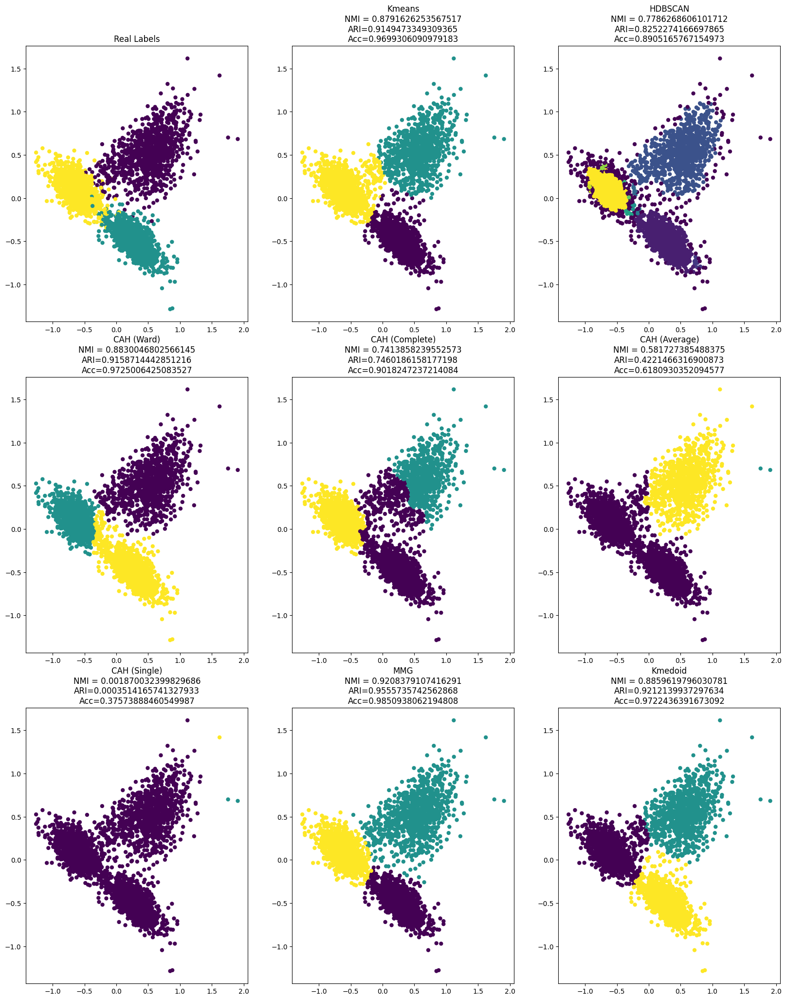

time: 4.4 s (started: 2023-05-19 01:26:49 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic3_glove)
results_classic3_glove['pca2'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
Après l'application des méthodes de clustering sur l'espace réduit en utilisant PCA avec 2 dimensions, nous constatons une nette amélioration des scores par rapport aux résultats obtenus dans l'espace d'origine, notamment pour les méthodes de clustering HDBSCAN et CAH (complete). L'accuracy dépasse désormais 89%, le NMI dépasse 74% et l'ARI dépasse 74%. En ce qui concerne la formation des clusters, nous observons que la méthode CAH (complete) réussit cette fois-ci à former les 3 clusters qui sont mieux séparés et homogènes, tandis que les clusters de HDBSCAN restent chevauchés.

Nous pouvons également remarquer que les résultats obtenus par CAH (single) n'ont pas été améliorés ni en termes de scores ni en formation des clusters, tandis que la méthode CAH avec le critère average dont les résultats se sont améliorés  accuracy=61%, NMI=58 et ARI=42% , cepandant elle n'a pas réussi à former les 3 clusters.

**TSNE+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


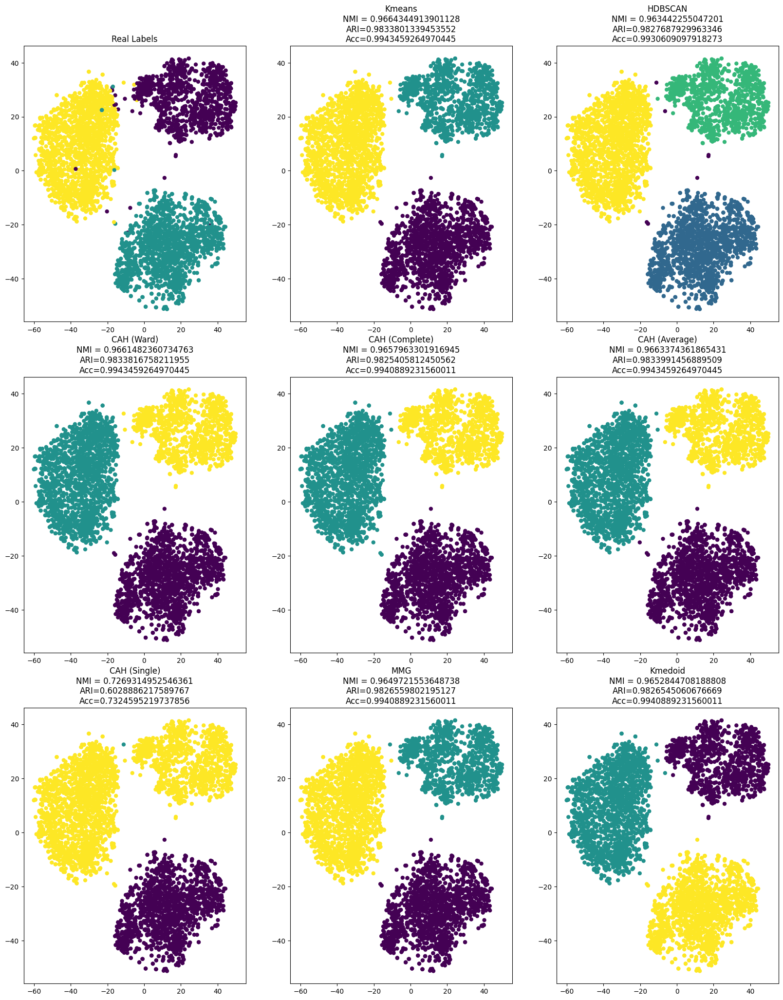

time: 49.4 s (started: 2023-05-19 01:26:53 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic3_glove)
results_classic3_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic3, map_labels(classic3_labels))

**Interprétation:**
Après l'application des méthodes de clustering sur l'espace réduit en utilisant t-SNE avec 2 dimensions, nous constatons une nette amélioration des scores pour toutes les méthodes de clustering et surtout  k-means, MMG, K-medoid, CAH (average, ward, complete) et HDBSCAN  avec un taux d'accuracy dépasse désormais 99%, le NMI dépasse 96% et l'ARI dépasse 98%. De plus, nous observons que les clusters formés sont mieux séparés et homogènes par rapport aux résultats précédents.

 

**UMAP+ Méthodes de clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


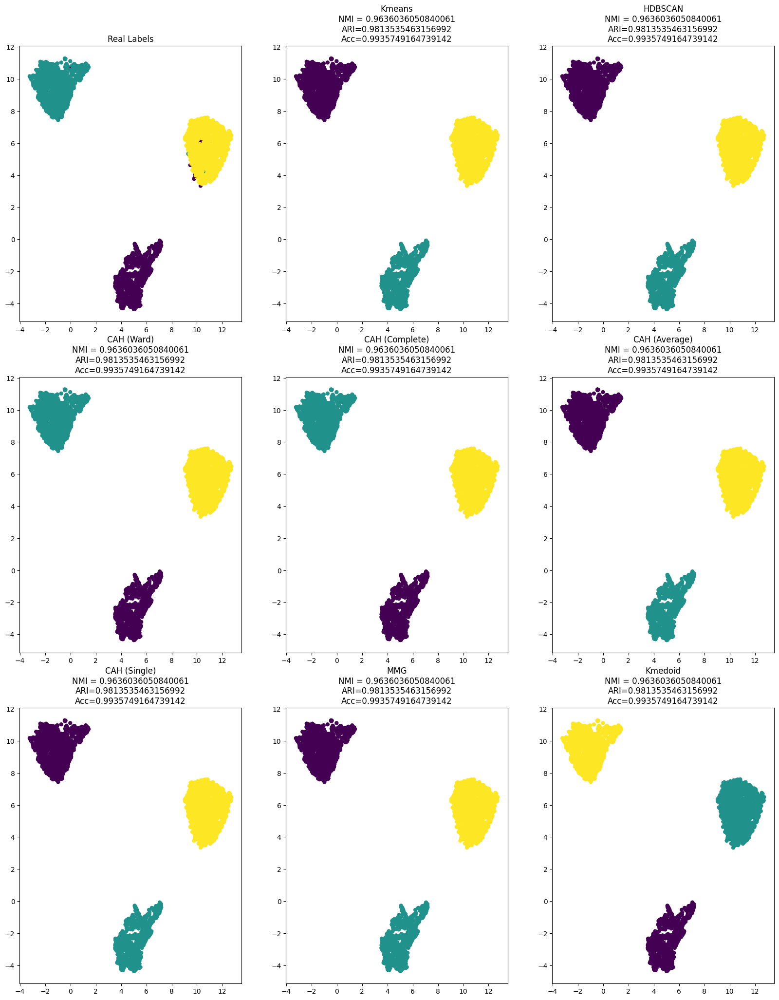

time: 27.4 s (started: 2023-05-19 01:27:42 +00:00)


In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic3_glove)
results_classic3_redim['umap'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
La technique UMAP avec 2 dimensions a produit des résultats significativement meilleurs en termes de scores pour toutes les méthodes de clustering que nous avons utilisées. L'accuracy dépasse 99%, le NMI dépasse 96% et l'ARI dépasse 98%. De plus, les résultats de la méthode CAH avec le critère single se sont améliorés cette fois-ci, surpassant ceux obtenus avec t-SNE.

Il est à noter que toutes les méthodes de clustering ont clairement démontré une grande séparabilité et homogénéité des clusters formés.

**Autoencoder+ Méthodes de clustering**

100%|██████████| 50/50 [00:13<00:00,  3.69it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


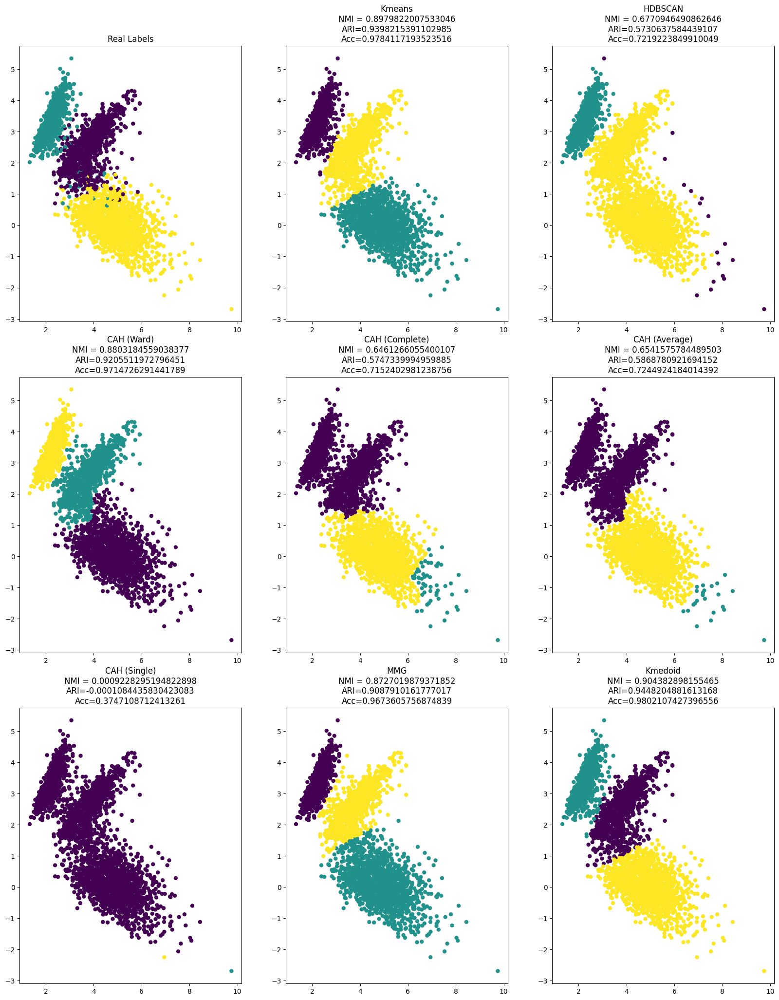

time: 23.9 s (started: 2023-05-19 01:28:10 +00:00)


In [ ]:
n_components=2
X_reduced = autoencoder(classic3_glove.astype("float32"), n_components, seed=42, learning_rate=1e-3)
results_classic3_glove['autoencoder'] = run_clustering(X_reduced, k_classic3, map_labels(classic3_labels))

**Interprétation:**
Après l'application des méthodes de clustering sur l'espace réduit en utilisant l'autoencodeur avec 2 dimensions, nous remarquons en général une diminution des scores obtenus pour toutes les méthodes de clustering par rapport aux résultats précédents. En particulier, la méthode CAH (critère=single) présente un taux d'accuracy de 37%, un ARI de 0,001% et un NMI de 0,0009%. ainsi que la méthode HDBSCAN affiche un taux d'accuracy de 72%, un ARI de 57% et un NMI de 67%. De plus, ces deux méthodes ont formé des clusters qui se chevauchent.

D'un autre côté, les méthodes telles que K-means, K-medoid, MMG et CAH (ward, complete) ont réussi à former des clusters distincts, cependant, ils présentent une séparation et une homogénéité moindres par rapport aux résultats obtenus avec UMAP et t-SNE

 

In [ ]:
from copy import deepcopy
results_temp = deepcopy(results_classic3_glove)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 6.29 ms (started: 2023-05-19 01:28:34 +00:00)


In [ ]:
results_glove = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 5.61 ms (started: 2023-05-19 01:28:34 +00:00)


**Tablleau récapitulatif des résultats obtenus**

In [ ]:
results_glove

nmi       ari       acc
original    Kmeans               0.885395  0.920503  0.971987
            Spectral Clustering  0.331071  0.019405  0.028784
            HDBSCAN              0.150426  0.111047  0.468003
            CAH (Ward)           0.971035  0.986272  0.995374
            CAH (Complete)       0.544035  0.394375  0.736058
            CAH (Average)        0.001402 -0.000138  0.374968
            CAH (Single)         0.001249  0.000234  0.375482
            MMG                  0.901912  0.932016  0.976099
            Kmedoid              0.885761  0.927252  0.975071
pca2        Kmeans               0.879163  0.914947  0.969931
            HDBSCAN              0.778627  0.825227  0.890517
            CAH (Ward)           0.883005  0.915871  0.972501
            CAH (Complete)       0.741386  0.746019  0.901825
            CAH (Average)        0.581727  0.422147  0.618093
            CAH (Single)         0.001870  0.000351  0.375739
            MMG                  0.920838  0.955574  0.985094
            Kmedoid              0.885962  0.921214  0.972244
autoencoder Kmeans               0.897982  0.939822  0.978412
            HDBSCAN              0.677095  0.573064  0.721922
            CAH (Ward)           0.880318  0.920551  0.971473
            CAH (Complete)       0.646127  0.574734  0.715240
            CAH (Average)        0.654158  0.586878  0.724492
            CAH (Single)         0.000923 -0.000108  0.374711
            MMG                  0.872702  0.908791  0.967361
            Kmedoid              0.904383  0.944820  0.980211

time: 22.4 ms (started: 2023-05-19 01:28:34 +00:00)


Après avoir examiné les résultats de toutes les méthodes de clustering appliquées sur l'espace d'origine et sur l'espace réduit, il est clair, d'après le tableau récapitulatif, que la méthode CAH avec le critère ward a obtenu les meilleurs scores (accuracy=99.53%, NMI=97.10% et ARI=98.62%) lorsqu'elle est appliquée sur l'espace d'origine. Cependant, lorsque cette méthode (CAH avec critère ward) est appliquée sur l'espace réduit par t-SNE et surtout par UMAP, elle démontre une séparation et une homogénéité des clusters nettement meilleures.

In [ ]:
metric = "ari"
results_glove[results_glove[metric] == results_glove[metric].max()]

,,nmi,ari,acc
original,CAH (Ward),0.971035,0.986272,0.995374


time: 11.5 ms (started: 2023-05-19 01:28:34 +00:00)


In [ ]:
metric = "nmi"
results_glove[results_glove[metric] == results_glove[metric].max()]

,,nmi,ari,acc
original,CAH (Ward),0.971035,0.986272,0.995374


time: 10.9 ms (started: 2023-05-19 01:28:34 +00:00)


Le modèle le plus performant en terme des scores est CAH avec le critère Ward lorsqu'il est appliqué sur l'espace d'origine

In [ ]:
metric = "acc"
results_glove[results_glove[metric] == results_glove[metric].max()]

,,nmi,ari,acc
original,CAH (Ward),0.971035,0.986272,0.995374


time: 11.4 ms (started: 2023-05-19 01:28:34 +00:00)


In [ ]:
best_labels = AgglomerativeClustering(n_clusters=k_classic3).fit_predict(classic3_glove)

time: 2.75 s (started: 2023-05-19 01:28:34 +00:00)


Class: 0


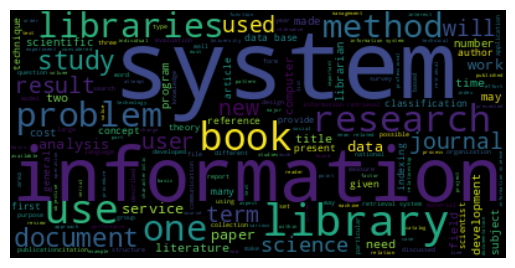



Class: 1


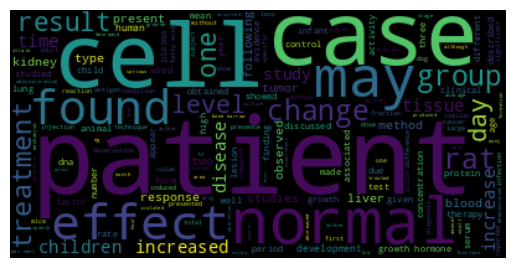



Class: 2


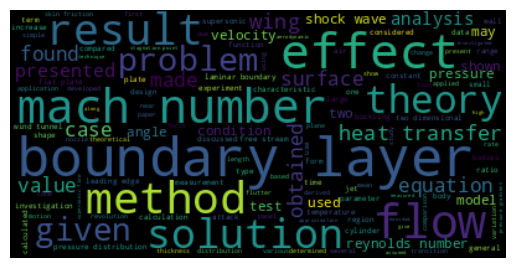



time: 5.67 s (started: 2023-05-19 01:28:37 +00:00)


In [ ]:
print_wordcloud(df['text'].values, best_labels)

Class: cisi


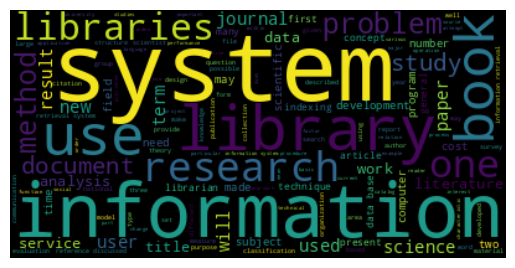



Class: med


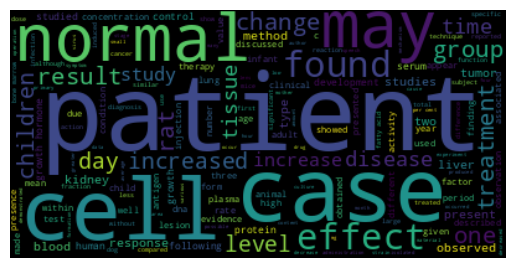



Class: cran


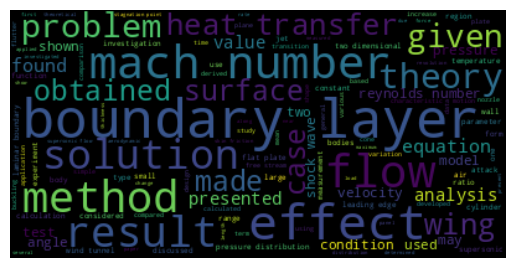



time: 3.71 s (started: 2023-05-19 01:28:42 +00:00)


In [ ]:
print_wordcloud(df['text'].values, df['label'].values)

Après avoir analysé et examiné le nuage de mots et en comparant les classes prédites avec les vraies classes, nous remarquons ce qui suit :

La classe 0 (prédite) est approximativement associée à "cisi" (la vraie classe) en raison de la similarité des termes les plus fréquents présents dans les deux classes.
La classe 1 correspond approximativement à "med" car les termes les plus fréquents sont les mêmes dans ces deux classes.
La classe 2 peut être associée approximativement à "cran" en raison de la présence de termes les plus fréquents communs à ces deux classes.

**Les méthodes d'estimation du nombre de clusters en utilisant l'algorithme Kmeans**

---



**à l'aide de la moyenne du score silhouette**
 



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

time: 703 µs (started: 2023-05-19 01:28:46 +00:00)


In [ ]:
def compute_average_silhouette(data, k):
    # Créez un modèle K-means avec K clusters
    kmeans = KMeans(n_clusters=k)
    labels = kmeans.fit_predict(data)
    
    # Calculez la silhouette moyenne
    silhouette_avg = silhouette_score(data, labels)
    
    # Calculez les valeurs de silhouette individuelles
    sample_silhouette_values = silhouette_samples(data, labels)
    
    return silhouette_avg, sample_silhouette_values

time: 814 µs (started: 2023-05-19 01:28:46 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

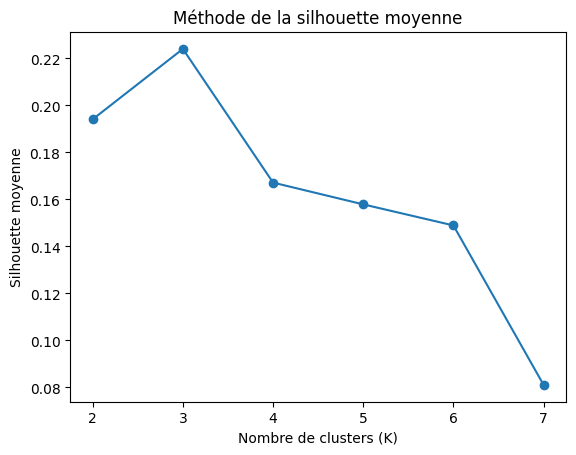

time: 17.7 s (started: 2023-05-19 01:28:46 +00:00)


In [ ]:
data=classic3_glove
silhouette_avgs=[]
k_values = range(2, 8)
for k in k_values:
    silhouette_avg, _ = compute_average_silhouette(data, k)
    silhouette_avgs.append(silhouette_avg)

plt.plot(k_values, silhouette_avgs, marker='o')
plt.xlabel('Nombre de clusters (K)')
plt.ylabel('Silhouette moyenne')
plt.title('Méthode de la silhouette moyenne')
plt.show()

 En analysant la courbe de la silhouette moyenne en fonction du nombre de clusters, nous remarquons que le nombre de clusters approprié, k, correspond au score le plus élevé de la silhouette moyenne, qui est de 0.22. Par conséquent, nous pouvons conclure que k=3 serait le nombre de clusters approprié.

**à l'aide de l'indice CH**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score

def compute_calinski_harabasz(data, k):
    # Créez un modèle K-means avec K clusters
    kmeans = KMeans(n_clusters=k)
    labels = kmeans.fit_predict(data)
    
    # Calculez l'indice Calinski-Harabasz
    ch_score = calinski_harabasz_score(data, labels)
    
    return ch_score

time: 1.22 ms (started: 2023-05-19 01:29:04 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

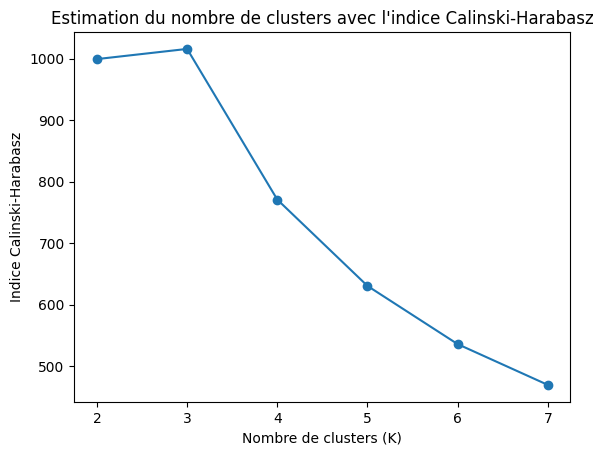

time: 12.8 s (started: 2023-05-19 01:29:04 +00:00)


In [ ]:
ch_scores = []
k_values = range(2, 8)
data=classic3_glove
for k in k_values:
    ch_score = compute_calinski_harabasz(data, k)
    ch_scores.append(ch_score)

# Plot
plt.plot(k_values, ch_scores, marker='o')
plt.xlabel('Nombre de clusters (K)')
plt.ylabel('Indice Calinski-Harabasz')
plt.title('Estimation du nombre de clusters avec l\'indice Calinski-Harabasz')
plt.show()

D'après le graphique de l'indice CH en fonction du nombre de clusters, nous observons que le nombre de clusters approprié, k, correspond au score maximal de l'indice CH, qui est superieur à 1000. Cela indique que k=3 serait le nombre de clusters adéquat.